# Multi-filter response: [28, 110]

MODEL: unit-wnet-wrferaext18-16f-mean0-trainer-3resblks-4ds-bse-drop2-ssim-simenc2/output/gen_02025001.pt





### multi-filter subs


In [2317]:
def calc_filter_variance(input_chunk, bn_mean_era, gen, filters):
    generated_chunk = gen.decode(bn_mean_era).detach().numpy()
    avg_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    avg_decoded_denorm = generated_chunk_denorm[0]

    encoded_extreme = gen.encode(input_chunk)[0].detach()
    generated_chunk = gen.decode(encoded_extreme).detach().numpy()
    front_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    front_decoded_denorm = generated_chunk_denorm[0]

    newbn = bn_mean_era.clone()

    for ff in filters:
        newbn[0, ff, :, :] = encoded_extreme[0, ff, :, :].clone()

    generated_chunk = gen.decode(newbn).detach().numpy()
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk_denorm = generated_chunk_denorm[0]

    err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(front_decoded)).detach())
    err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(front_decoded[ii])).detach())) for ii in range(18)]

    return [err, err18, filters, generated_chunk_denorm - avg_decoded_denorm]

In [2618]:
def apply_filter_substitutions(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmax=None, vmin=None):
    
    for ii in range(stormcount): #range(len(storms)):
        print('\nSTORM INDEX:', ii)
        input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
        input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

        xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)
        print(np.array(xx[3]).shape)

        if vmax == None or vmin == None:
            vmax = [-9999 for y in range(18)]  
            vmin = [9999 for y in range(18)]           
            vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
            vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

            vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
            vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]

        print("FILTERS", filters)
        svars = [0, 1, 2, 3, 4, 5, 6, 7, 8]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        svars = [9, 10, 11, 12, 13, 14, 15, 16, 17]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        
    return vmax, vmin

In [2631]:
storms.shape

torch.Size([26, 18, 192, 256])


STORM INDEX: 0


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


(18, 64, 64)
FILTERS [28, 110]


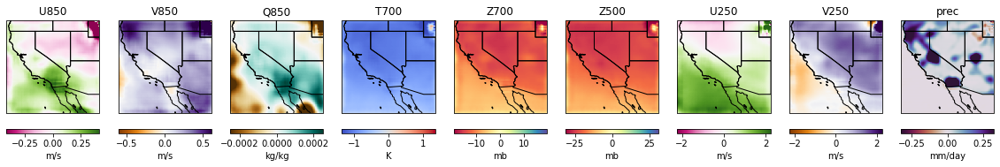

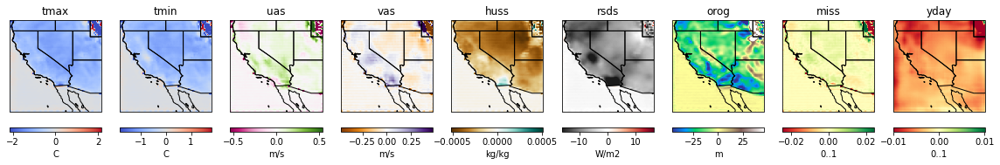


STORM INDEX: 0
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


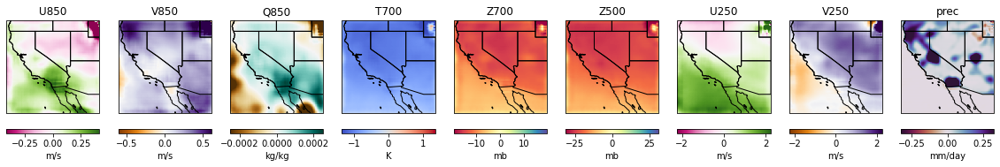

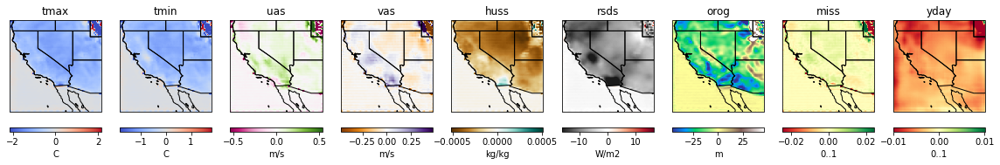


STORM INDEX: 1
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


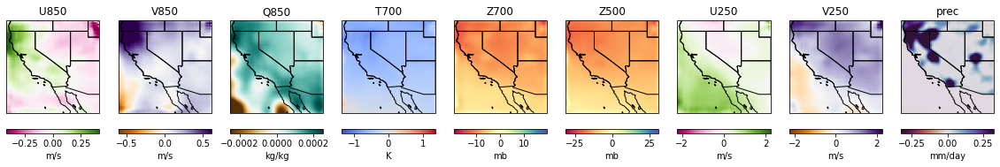

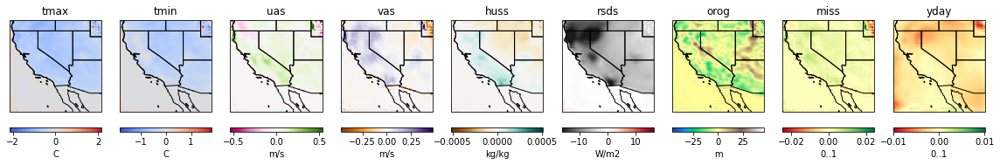


STORM INDEX: 2
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


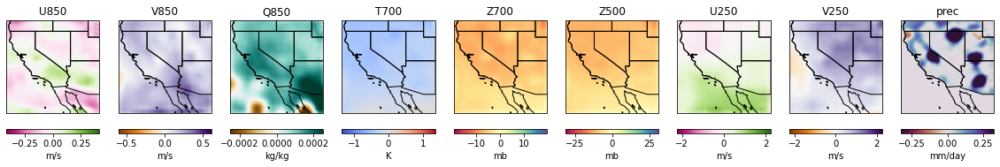

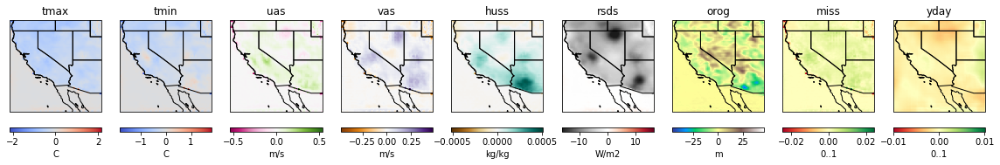


STORM INDEX: 3
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


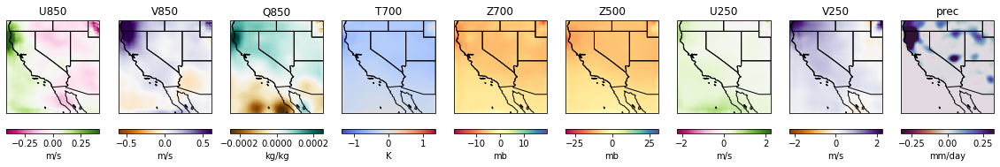

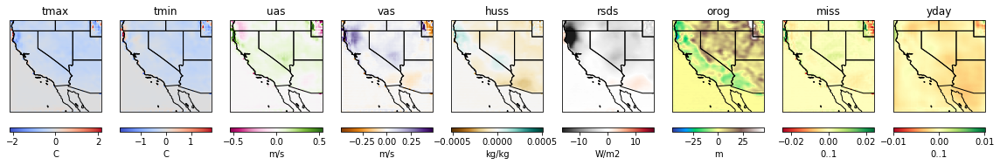


STORM INDEX: 4
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


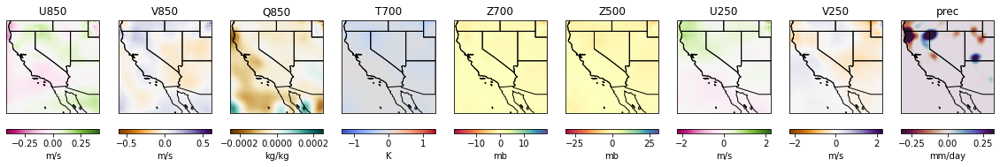

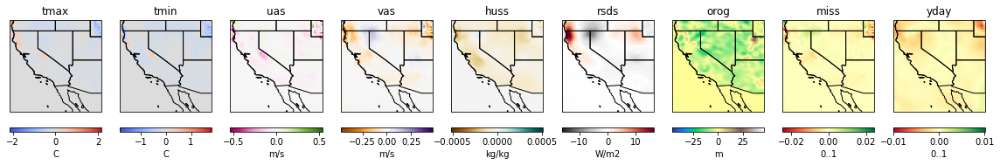


STORM INDEX: 5
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


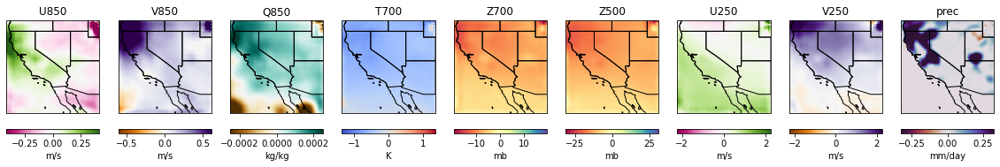

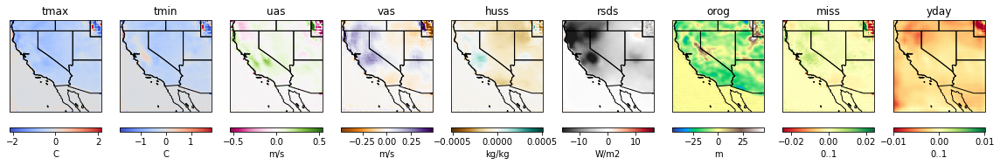


STORM INDEX: 6
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


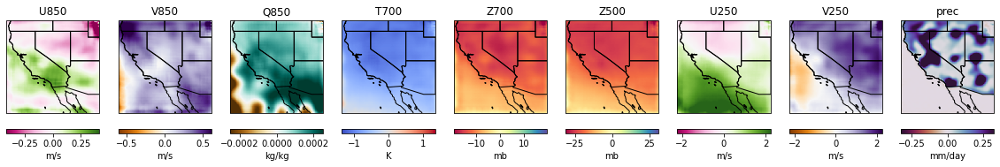

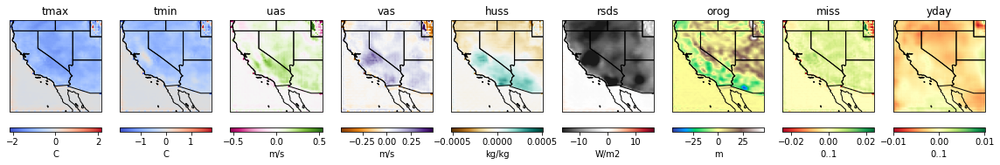


STORM INDEX: 7
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


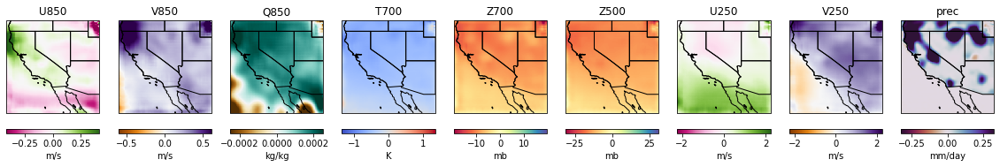

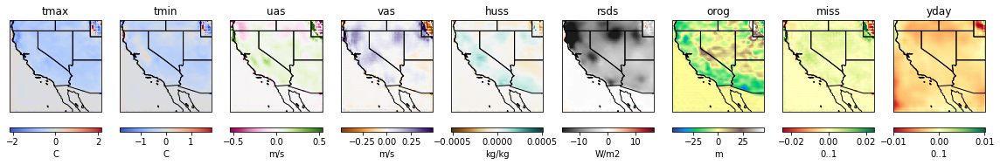


STORM INDEX: 8
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


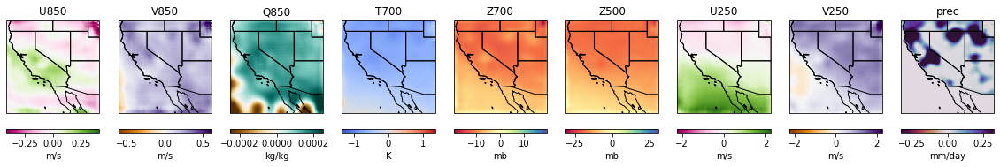

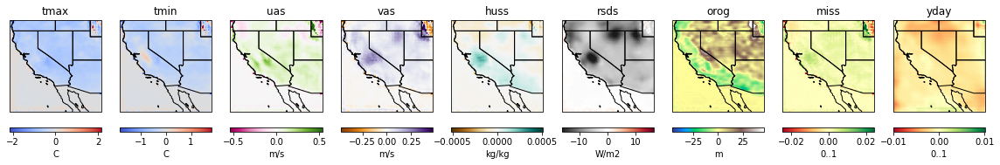


STORM INDEX: 9
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


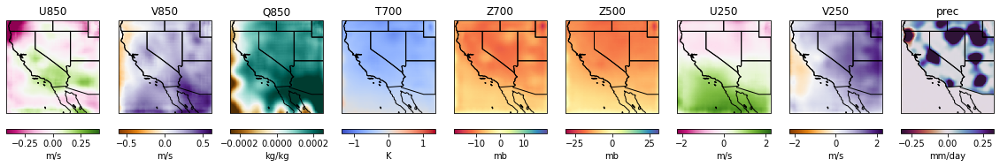

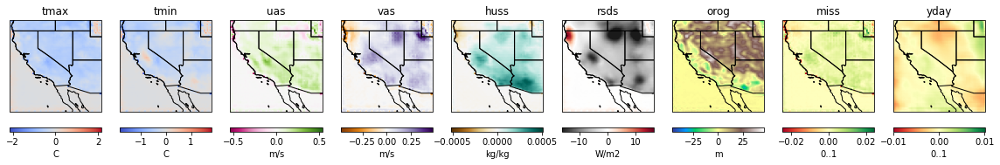


STORM INDEX: 10
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


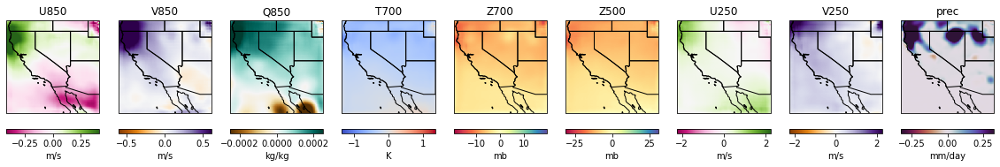

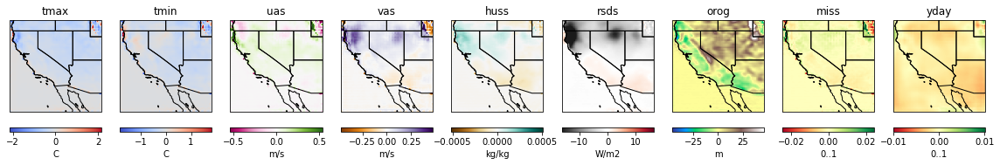


STORM INDEX: 11
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


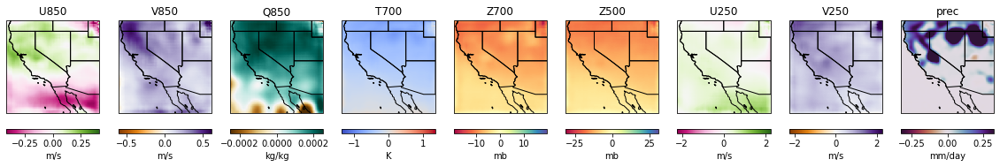

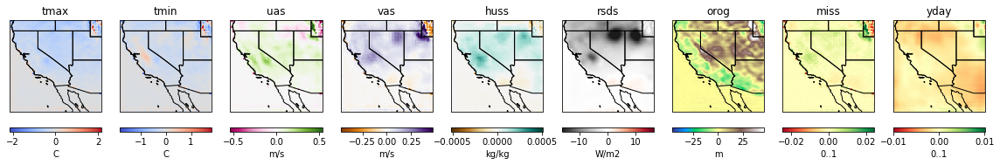


STORM INDEX: 12
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


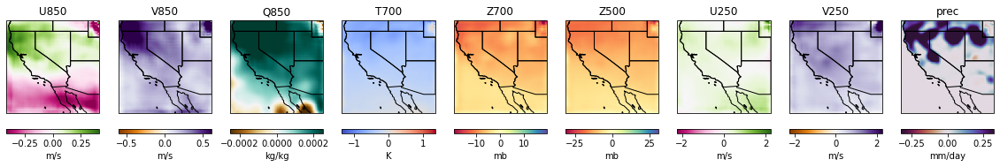

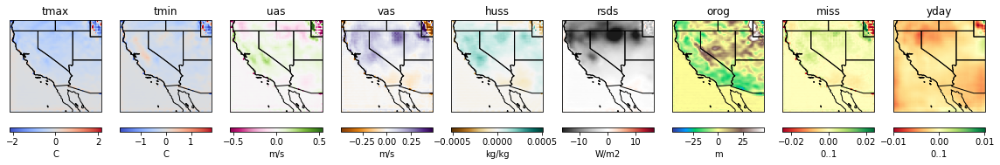


STORM INDEX: 13
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


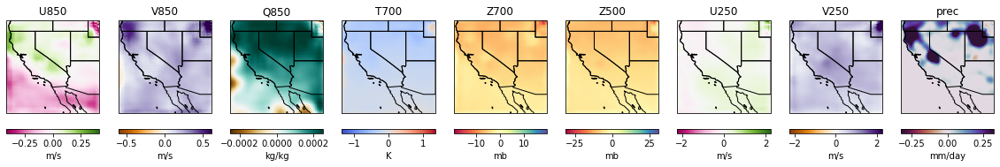

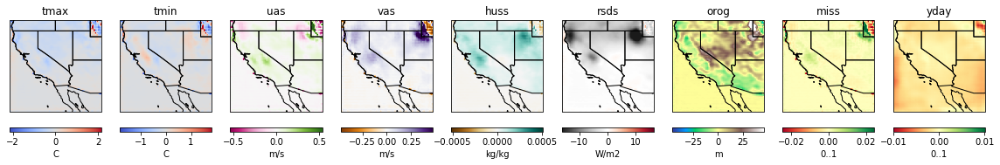


STORM INDEX: 14
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


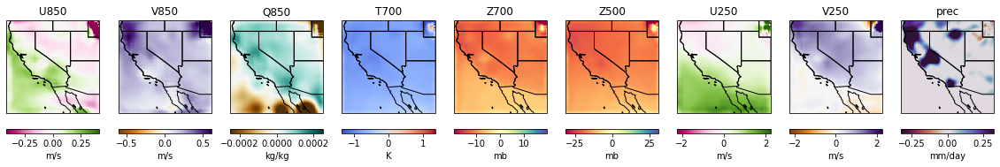

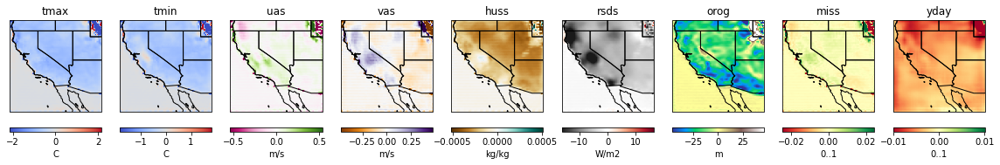


STORM INDEX: 15
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


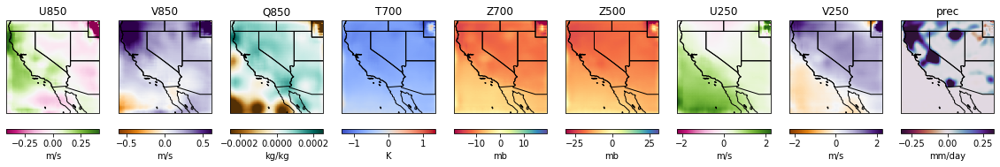

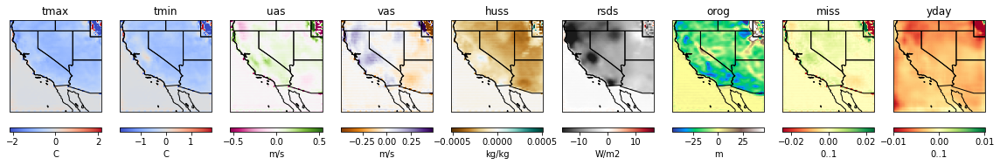


STORM INDEX: 16
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


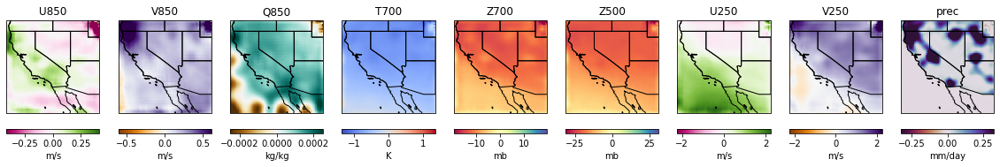

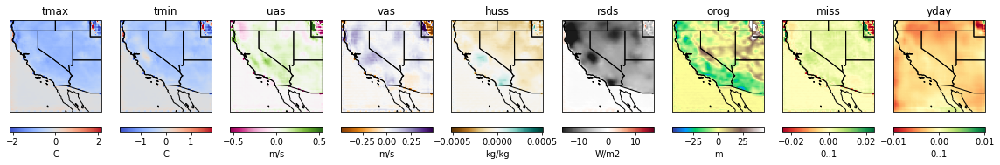


STORM INDEX: 17
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


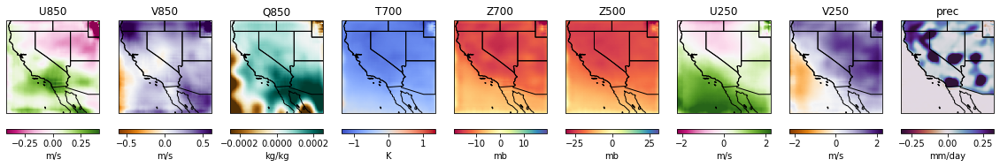

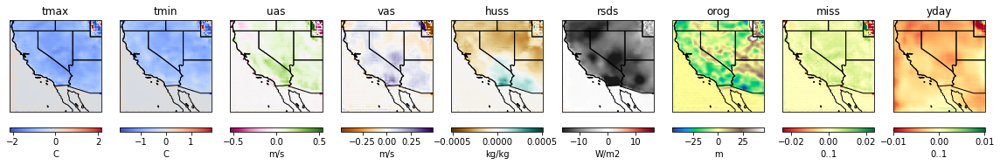


STORM INDEX: 18
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


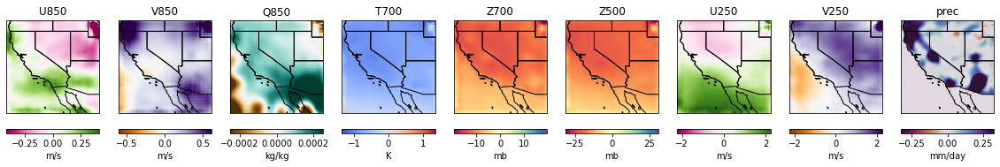

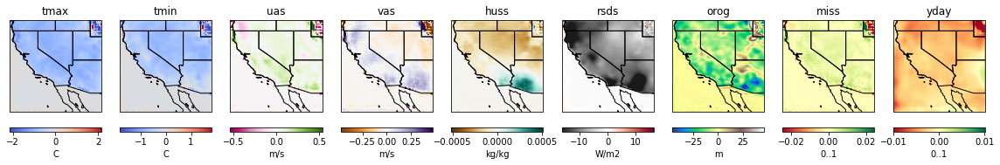


STORM INDEX: 19
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


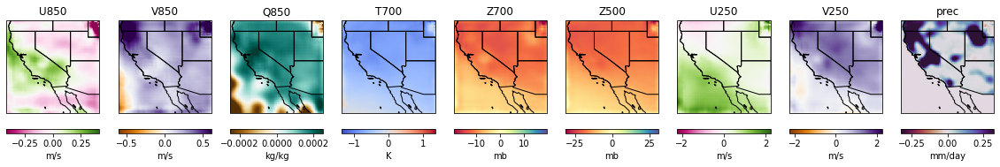

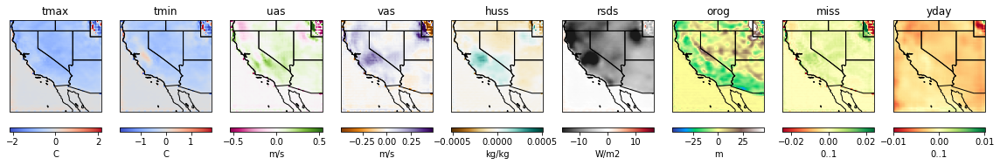


STORM INDEX: 20
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


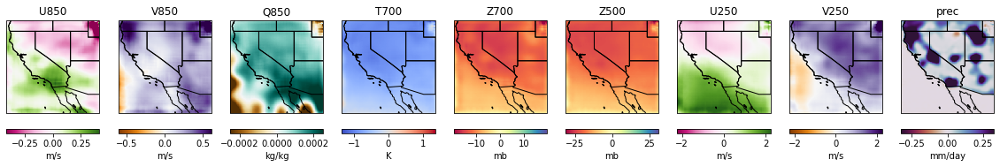

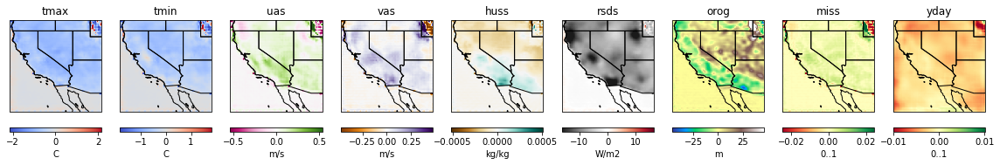


STORM INDEX: 21
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


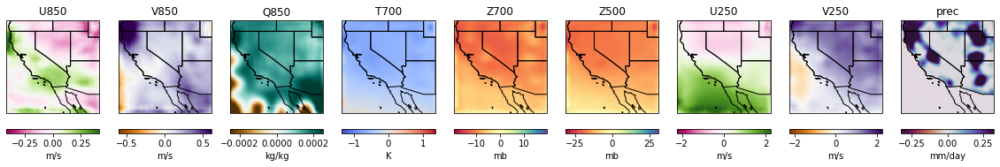

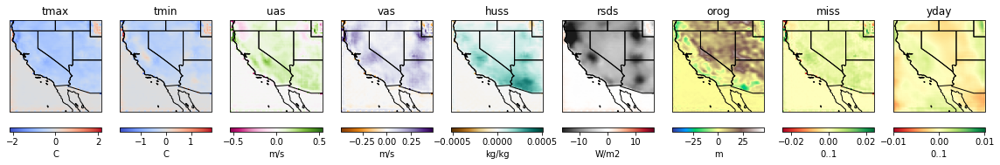


STORM INDEX: 22
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


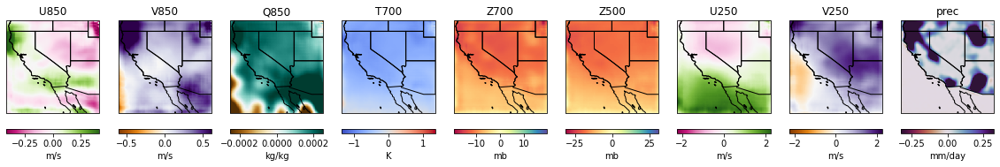

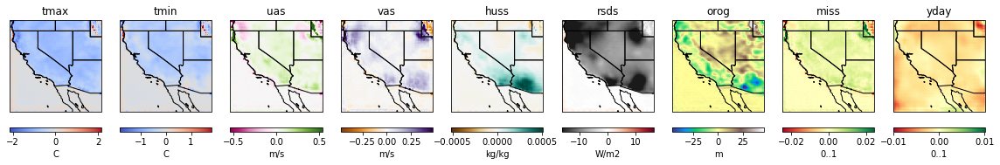


STORM INDEX: 23
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


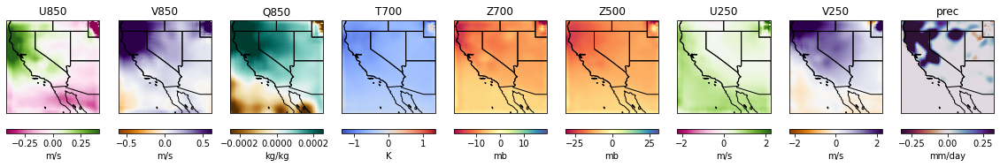

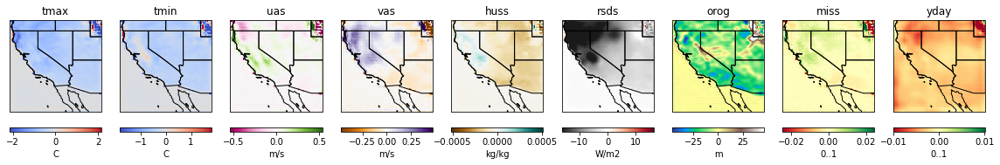


STORM INDEX: 24
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


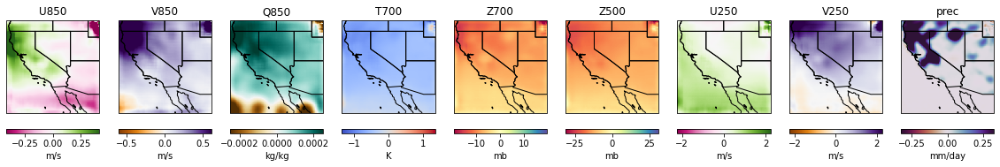

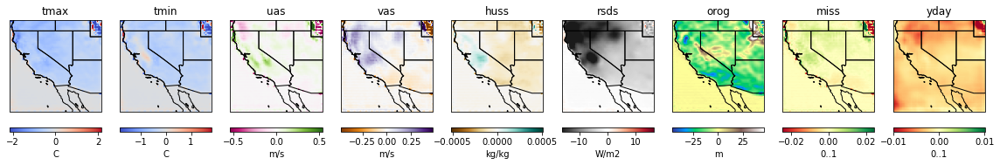


STORM INDEX: 25
(18, 64, 64)
FILTERS [28, 110]


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  


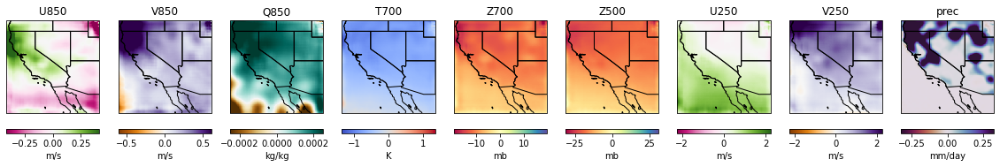

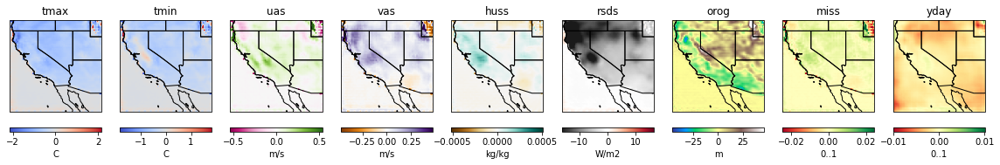

([0.4177103405878561,
  0.6130999438089946,
  0.0002541325609396619,
  -0.38778944620807815,
  -3.2667268970148147,
  -7.766134651442634,
  2.223907950588136,
  2.2674525321139205,
  0.32549990667658185,
  0.8562122881670702,
  0.7962430617900187,
  0.537351311139233,
  0.45397998754222557,
  0.0001487646974958834,
  4.337029552141748,
  29.861621542095406,
  0.0245328232870342,
  0.00043585841050404993],
 [-0.34632776246297264,
  -0.15976735583846152,
  -0.00022670110348539725,
  -1.355801877536511,
  -19.63762534068912,
  -31.34395293949759,
  -0.8975791357966665,
  -1.0338850100889563,
  -0.20647202735551456,
  -2.153771539831271,
  -1.8306283800654775,
  -0.48682986687834945,
  -0.47482214725914407,
  -0.0005143918073906387,
  -16.291562042164706,
  -46.852472429971044,
  -0.024038079597973872,
  -0.01010625539780737])

In [2632]:
#apply_filter_substitutions(storms, [0, 1, 2], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
vmax,vmin = apply_filter_substitutions(storms, [28, 110], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 1)
apply_filter_substitutions(storms, [28, 110], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26, vmin=vmin, vmax=vmax)

#apply_filter_substitutions(storms, [111, 7, 81, 94, 241, 39, 141, 100, 29, 12, 125, 70, 162, 222, 240, 183, 185, 231, 236, 87, 47, 119, 48, 82, 107, 101, 113, 74, 91, 23, 128, 126, 173, 202, 220, 36, 57, 242, 83, 175, 127, 164, 146, 234, 33, 174, 195, 212, 15, 21, 201, 215, 79, 157, 177, 11, 142, 85, 88, 253, 32, 151, 192, 92, 136, 77, 40, 67, 147, 163, 114, 211, 102, 224]
#, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
